<a href="https://colab.research.google.com/github/SNUH-AIeducation/SNUH-AI-Education-for-Clinicians/blob/master/Modality/WSI/patho_practice_pytorch_SNUH_log.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Segmentation task in digital pathology**
디지털 병리 영상을 이용한 딥러닝 기반 segmentation 모델 구축을 진행합니다.  
실습에 앞서 필요한 데이터와 라이브러리를 내려받습니다.  
[런타임]-[런타임 유형 변경]에서 하드웨어 가속기를 GPU로 변경합니다.  
라이브러리를 모두 받은 후에 꼭 **[런타임]-[런타임 다시 시작]**을 눌러주세요.

In [1]:
!wget --load-cookies ~/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies ~/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1MMZMfZc1MBW3jjiRlS_Kc6XNgc7VNmeX' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1MMZMfZc1MBW3jjiRlS_Kc6XNgc7VNmeX" -O wsi.zip && rm -rf ~/cookies.txt

--2021-08-20 07:53:17--  https://docs.google.com/uc?export=download&confirm=iaDf&id=1MMZMfZc1MBW3jjiRlS_Kc6XNgc7VNmeX
Resolving docs.google.com (docs.google.com)... 172.217.31.142, 2404:6800:4004:80b::200e
Connecting to docs.google.com (docs.google.com)|172.217.31.142|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-14-9s-docs.googleusercontent.com/docs/securesc/mift5n7tjcbt3ini6002fft5e653bglg/k4ue4m1vegallcs13l3qku86qj52s4m8/1629445950000/05935428956794410655/14990614708340241392Z/1MMZMfZc1MBW3jjiRlS_Kc6XNgc7VNmeX?e=download [following]
--2021-08-20 07:53:17--  https://doc-14-9s-docs.googleusercontent.com/docs/securesc/mift5n7tjcbt3ini6002fft5e653bglg/k4ue4m1vegallcs13l3qku86qj52s4m8/1629445950000/05935428956794410655/14990614708340241392Z/1MMZMfZc1MBW3jjiRlS_Kc6XNgc7VNmeX?e=download
Resolving doc-14-9s-docs.googleusercontent.com (doc-14-9s-docs.googleusercontent.com)... 216.58.197.193, 2404:6800:4004:81c::2001
Connecting to doc-1

In [2]:
!unzip wsi.zip -d ./wsi

Archive:  wsi.zip
   creating: ./wsi/best_ckpt/
  inflating: ./wsi/best_ckpt/best_model.pth  
   creating: ./wsi/HuBMAP/
  inflating: ./wsi/HuBMAP/0486052bb-anatomical-structure.json  
  inflating: ./wsi/HuBMAP/0486052bb.json  
  inflating: ./wsi/HuBMAP/0486052bb.tiff  
  inflating: ./wsi/HuBMAP/8242609fa-anatomical-structure.json  
  inflating: ./wsi/HuBMAP/8242609fa.json  
  inflating: ./wsi/HuBMAP/8242609fa.tiff  
  inflating: ./wsi/HuBMAP/aaa6a05cc-anatomical-structure.json  
  inflating: ./wsi/HuBMAP/aaa6a05cc.json  
  inflating: ./wsi/HuBMAP/aaa6a05cc.tiff  
  inflating: ./wsi/HuBMAP/HuBMAP-20-dataset_information.csv  
  inflating: ./wsi/HuBMAP/train.csv  
  inflating: ./wsi/SAS_21883_001.svs  


In [3]:
!apt-get install python3-openslide

Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-openslide is already the newest version (1.1.1-2ubuntu4).
0 upgraded, 0 newly installed, 0 to remove and 32 not upgraded.


In [4]:
!pip install --force-reinstall albumentations==1.0.3

  Using cached albumentations-1.0.3-py3-none-any.whl (98 kB)
     |████████████████████████████████| 640 kB 1.8 MB/s eta 0:00:01
  Using cached opencv_python_headless-4.5.3.56-cp36-cp36m-manylinux2014_x86_64.whl (37.1 MB)
     |████████████████████████████████| 12.4 MB 11.6 MB/s eta 0:00:01
     |████████████████████████████████| 25.9 MB 410 kB/s eta 0:00:01
     |████████████████████████████████| 14.8 MB 5.7 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 10.0 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 11.1 MB/s eta 0:00:01
     |████████████████████████████████| 3.0 MB 12.0 MB/s eta 0:00:01
     |████████████████████████████████| 11.5 MB 10.7 MB/s eta 0:00:01    |███████████████▎                | 5.5 MB 11.2 MB/s eta 0:00:01
     |████████████████████████████████| 4.4 MB 12.1 MB/s eta 0:00:01
     |████████████████████████████████| 148 kB 12.7 MB/s eta 0:00:01
     |████████████████████████████████| 67 kB 4.4 MB/s  eta 0:00:01
     |██████████████

In [5]:
!pip install segmentation-models-pytorch

     |████████████████████████████████| 87 kB 497 kB/s eta 0:00:011
     |████████████████████████████████| 58 kB 2.7 MB/s eta 0:00:01
     |████████████████████████████████| 376 kB 3.6 MB/s eta 0:00:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12420 sha256=308960a7a9a5557f89376dbdf38e7d273166b2ac0a8876ab5d304fe1ea2f7ed3
  Stored in directory: /root/.cache/pip/wheels/1c/07/d1/ff77968842daae1dde944173a8e8a7be193646d37842f13b24
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60963 sha256=2d680c143690d19faee6b6c3716f0e398b38dc1214044761a32a31173f99fe7b
  Stored in directory: /root/.cache/pip/wheels/9c/03/81/494596f1d017bbf80daf53bc33dbb05aaa5a6ad6d44c74011f
Successfully built efficientnet-pytorch pretrainedmodels


In [6]:
!pip install imagecodecs

     |████████████████████████████████| 17.9 MB 6.9 MB/s eta 0:00:01


## Opening

- Step 1. HuBMAP - Hacking the kidney
    - Step 1-1. Dataset specifications
    - Step 1-2. Dataset structure
        - Step 1-2-1. Whole Slide Image(.tiff)
        - Step 1-2-2. Anatomical structure(.json)
        - Step 1-2-3. Glomeruli label(.json, RLE)
- Step 2. 데이터 전처리: WSI patch generation
- Step 3. 데이터셋 구축
- Step 4. 모델 학습
- Step 5. 평가
    - Step 5-1. Patch-wise validation
    - Step 5-2. Whole image-wise validation
    - Step 5-3. IoU score

## **Step 1. HuBMAP - Hacking the kidney**
본 실습에서는 kaggle의 'HuBMAP Glomeruli FTU Segmentation Dataset'을 활용해  
디지털 병리 영상에서 `Glomeruli`를 분할하는 segmentation model 구축을 진행합니다.  
https://www.kaggle.com/c/hubmap-kidney-segmentation

![hubmap_results](https://github.com/SNUH-AIeducation/SNUH-AI-Education-for-Clinicians/blob/master/Modality/WSI/img/hubmap_glom.png?raw=true)

reference: https://www.kaggle.com/ihelon/hubmap-exploratory-data-analysis

## Step 1-1. Dataset specifications
Human BioMolecular Atlas Program(HuBMAP)이 NIH의 후원을 통해 개최한 위 competition은  
병리 영상에서 `functional tissue units (FTUs)`을 분할하는 것을 목표로 합니다.  
본 challenge의 설명에 따르면 조직 내의 FTU 크기, 모양, 수, 위치 정보를 찾는 것이 의학적으로 유효하다고 말합니다.  
위 competition에서는 그 중 normal glomeruli을 분할하고자 합니다.


데이터셋 구성은 다음과 같습니다.
- 20 kidney tissue sections
    - 11 fresh frozen (FF) carboxymethylcellulose(CMC) embedded
    - 9 formalin fixed paraffin embedded (FFPE)
- Each sample has the following data:
    - PAS stain microscopy image(RGB-channel TIFF)
        - The histology stained image is saved as a 24 bit RGB .tif file.
        - The spatial resolution is .5 micron per pixel
    - Anatomical structure segmentation mask(JSON)
    - Glomeruli segmentation mask(JSON)
- Known clinical metadata

## Step 1-2. Dataset structure
HuBMAP 데이터셋 구조는 다음과 같습니다.

- Anatomical structure(json)
- Glomeruli label(json)
- Whole Slide Image(tiff)

그 외에도 race, sex, age와 같은 clinical metadata도 포함되어 있습니다.  
-> HuBMAP-20-dataset_information.csv

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import PIL.Image as Image
import tifffile as tiff

In [2]:
HuBMAP_PATH = "./wsi/HuBMAP/"

In [3]:
hubmap_data_info = pd.read_csv(os.path.join(HuBMAP_PATH, 'HuBMAP-20-dataset_information.csv'))
hubmap_data_info.tail()

,image_file,width_pixels,height_pixels,anatomical_structures_segmention_file,glomerulus_segmentation_file,patient_number,race,ethnicity,sex,age,weight_kilograms,height_centimeters,bmi_kg/m^2,laterality,percent_cortex,percent_medulla
15,2ec3f1bb9.tiff,47723,23990,2ec3f1bb9-anatomical-structure.json,2ec3f1bb9.json,67112,White,Not Hispanic or Latino,Male,56,91.2,167.6,32.5,Left,80,20
16,0486052bb.tiff,34937,25784,0486052bb-anatomical-structure.json,0486052bb.json,67177,White,Not Hispanic or Latino,Male,31,106.1,180.3,32.6,Right,80,20
17,3589adb90.tiff,22165,29433,3589adb90-anatomical-structure.json,3589adb90.json,68304,White,Not Hispanic or Latino,Female,66,71.3,167.6,25.4,Left,55,45
18,2f6ecfcdf.tiff,25794,31278,2f6ecfcdf-anatomical-structure.json,2f6ecfcdf.json,68555,White,Not Hispanic or Latino,Female,76,93.0,157.4,37.5,Left,80,20
19,8242609fa.tiff,44066,31299,8242609fa-anatomical-structure.json,8242609fa.json,66999,White,Not Hispanic or Latino,Male,56,91.4,181.6,27.7,Right,65,35


### Step 1-2-1. Whole Slide Image(.tiff)
본 challenge의 Kidney WSI는 tiff 파일로 구성되어 있습니다.  

In [4]:
DOWNSAMPLE_FACTOR = 16 # level4 resolution

Text(0.5, 1.0, '0486052bb.tiff')

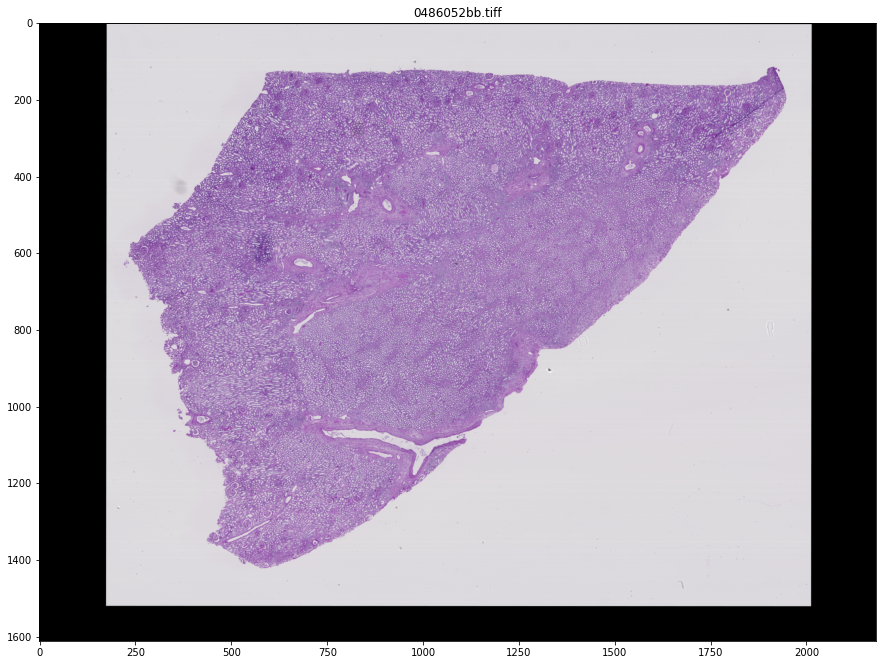

In [5]:
wsi_sample_lv4 = tiff.imread(os.path.join(HuBMAP_PATH, "0486052bb.tiff")) #openslide open level4
wsi_sample_lv4 = cv2.resize(wsi_sample_lv4,
                            (wsi_sample_lv4.shape[1]//DOWNSAMPLE_FACTOR,wsi_sample_lv4.shape[0]//DOWNSAMPLE_FACTOR),
                            interpolation = cv2.INTER_AREA)
plt.figure(figsize=(15,15))
plt.imshow(wsi_sample_lv4)
plt.title("0486052bb.tiff")

### Step 1-2-2. Anatomical structure(.json)
Kidney 조직 WSI 영상의 anatomical structure를 json 파일로 제공합니다.

![Anatomical_structure](https://github.com/SNUH-AIeducation/SNUH-AI-Education-for-Clinicians/blob/master/Modality/WSI/img/anatomical_structure.png?raw=true)

reference: https://www.kaggle.com/leahscherschel/dataset-details

In [6]:
import json

In [7]:
structure_data_sample = json.load(open(os.path.join(HuBMAP_PATH, "0486052bb-anatomical-structure.json"), 'r'))
structure_data_sample #list (x, y) 이 때, x좌표의 0은 왼쪽 y좌표의 0은 상단입니다.

[{'type': 'Feature',
  'id': 'PathAnnotationObject',
  'geometry': {'type': 'Polygon',
   'coordinates': [[[20606, 4432],
     [17525, 5552],
     [15543, 5315],
     [14638, 6134],
     [14509, 6823],
     [14530, 6823],
     [15912, 8144],
     [13906, 9194],
     [11327, 9296],
     [11321, 9296],
     [10420, 9845],
     [11079, 10191],
     [11086, 10191],
     [12209, 10621],
     [12034, 11573],
     [10778, 12541],
     [10778, 12556],
     [10385, 13736],
     [11187, 16428],
     [11202, 16443],
     [11913, 17275],
     [11928, 17275],
     [11928, 17290],
     [15165, 18152],
     [15180, 19468],
     [17460, 17659],
     [18537, 17121],
     [28275, 7039],
     [25582, 6134],
     [25647, 5121],
     [25625, 5100],
     [25625, 5078],
     [25625, 5057],
     [25625, 5035],
     [25625, 5014],
     [24806, 4777],
     [23880, 5768],
     [23083, 5854],
     [21618, 6177],
     [20541, 5918],
     [20606, 4432]]]},
  'properties': {'classification': {'name': 'Medulla', 'col

In [8]:
# json 내의 anatomical structure 개수와 구성
len(structure_data_sample)

2

In [9]:
for i in range(len(structure_data_sample)):
    print(structure_data_sample[i]["properties"]["classification"]["name"])

Medulla
Cortex


In [10]:
structure_data_sample[1] #dict in list 

{'type': 'Feature',
 'id': 'PathAnnotationObject',
 'geometry': {'type': 'Polygon',
  'coordinates': [[[30717, 1373],
    [29858, 1708],
    [29715, 2281],
    [27040, 2281],
    [18445, 1947],
    [11520, 1612],
    [11520, 1660],
    [11472, 1660],
    [8989, 1756],
    [8273, 3427],
    [8225, 3475],
    [3784, 8632],
    [3354, 9778],
    [3402, 9874],
    [3450, 9874],
    [3927, 12118],
    [3927, 12166],
    [5455, 17705],
    [5503, 17705],
    [6697, 18326],
    [6984, 18995],
    [6888, 20332],
    [6840, 20332],
    [6840, 20427],
    [6745, 20571],
    [6458, 21717],
    [6458, 21765],
    [6506, 21765],
    [6984, 22290],
    [6984, 22385],
    [6984, 22433],
    [7031, 22433],
    [9371, 23770],
    [9419, 23722],
    [9467, 23722],
    [11664, 22863],
    [11711, 22863],
    [11711, 22815],
    [15102, 20332],
    [15102, 20284],
    [14911, 18183],
    [12141, 17419],
    [10947, 16464],
    [10899, 16416],
    [10852, 16321],
    [10708, 16082],
    [9944, 13694],
    

json 파일은 좌표로 구성되어 있어 각 좌표를 이어주면 해당 polygon을 얻을 수 있습니다.

![coordinate_to_poly](https://qph.fs.quoracdn.net/main-qimg-2a0bdb4c01da036091c068fcc4c4ff0a.webp)

In [11]:
# Cortex
poly_coordi = structure_data_sample[1]['geometry']['coordinates'] #level0 coordinates 
poly_coordi = np.int32(np.array(poly_coordi) / DOWNSAMPLE_FACTOR) #level4 coordinates
cortex_lv4 = wsi_sample_lv4.copy()
cortex_lv4 = cv2.polylines(cortex_lv4, np.int32([poly_coordi]), True, (0, 255, 0), 5)

Text(0.5, 1.0, '0486052bb.tiff - Cortex')

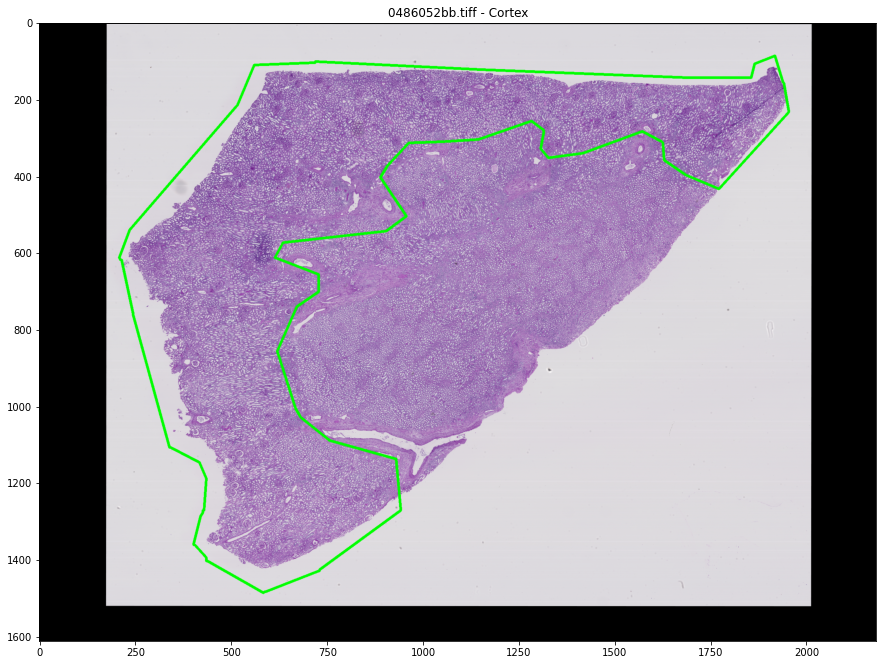

In [12]:
plt.figure(figsize=(15,15))
plt.imshow(cortex_lv4)
plt.title("0486052bb.tiff - Cortex")

### Step 1-2-3. Glomeruli label(.json, .csv)
target인 glomeruli 또한 json 파일로 구성되어 있습니다.   
또한 Run Length Encoding(RLE) 기법을 이용해 glomeruli mask 영상을 압축하였습니다.

In [13]:
mask_annotation_sample = json.load(open(os.path.join(HuBMAP_PATH, "0486052bb.json"), 'r'))
print(f"Number of glomerulus(mask): {len(mask_annotation_sample)}")

Number of glomerulus(mask): 130


In [14]:
mask_lv4 = np.zeros(wsi_sample_lv4.shape[0:2])
cnt = 0
for anno in mask_annotation_sample:
    label_name = anno['properties']['classification']['name']
    if label_name != 'glomerulus':
        continue
    anno_coordi = anno['geometry']['coordinates']
    if len(anno_coordi) <= 1:
        anno_coordi = np.int32(np.array(anno_coordi) / DOWNSAMPLE_FACTOR)
        mask_lv4 = cv2.fillPoly(mask_lv4, anno_coordi, True)
        cnt += 1
    else:
        anno_coordi = np.concatenate([np.array(anno_coordi[i]).squeeze() for i in range(len(anno_coordi))])
        anno_coordi = np.int32(np.array(anno_coordi) / DOWNSAMPLE_FACTOR)
        mask_lv4 = cv2.fillPoly(mask, anno_coordi, True)
        cnt += len(anno_coordi)
        
print(f"Added {cnt} glomerulus")

Added 130 glomerulus


Text(0.5, 1.0, '0486052bb.tiff - glomerulus')

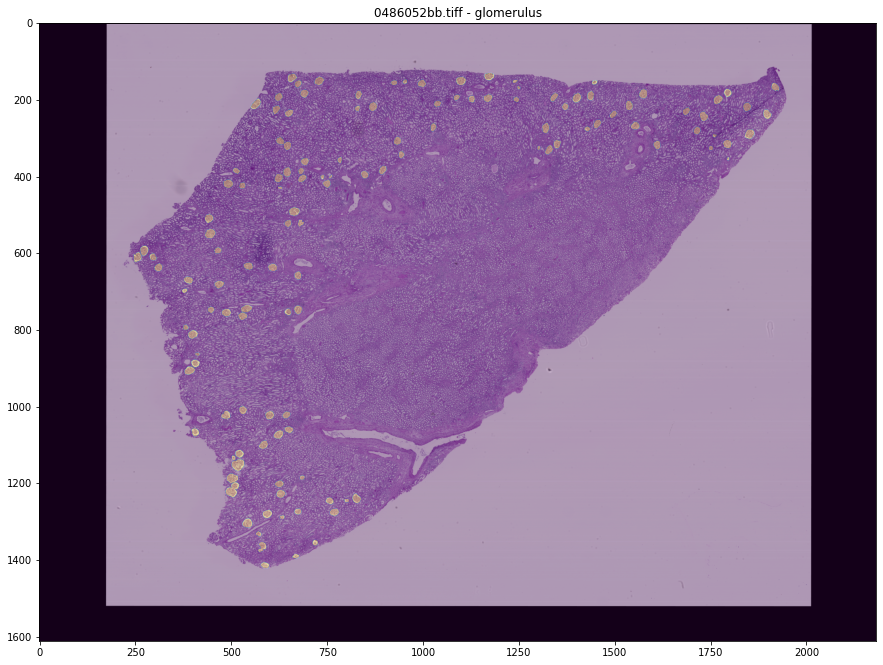

In [15]:
plt.figure(figsize=(15,15))
plt.imshow(wsi_sample_lv4)
plt.imshow(mask_lv4, alpha=0.3)
plt.title("0486052bb.tiff - glomerulus")

## Step 2. 데이터 전처리: WSI patch generation

In [16]:
# reference code: https://www.kaggle.com/mariazorkaltseva/hubmap-seresnext50-unet-dice-loss
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)

    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape[::-1]).T

# New version
def rle_encode_less_memory(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    This simplified method requires first and last pixel to be zero
    '''
    pixels = img.T.flatten()
    
    # This simplified method requires first and last pixel to be zero
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] -= runs[::2]
    
    return ' '.join(str(x) for x in runs)

def is_tile_contains_info(img, pixel_limits, content_threshold, expected_shape):
    """
    img: np.array
    pixel_limits: tuple
    content_threshold: float percents
    expected_shape: tuple
    """
    
    left_limit = np.prod(img > pixel_limits[0], axis=-1)
    right_limit =  np.prod(img < pixel_limits[1], axis=-1)

    if img.shape != expected_shape:
        return False, 0.

    percent_of_pixels = np.sum(left_limit*right_limit) / (img.shape[0] * img.shape[1])
    return  percent_of_pixels > content_threshold, percent_of_pixels

def extract_train_tiles(sample_img_path, rle_mask_sample, fname):
    """downsampling image and extract tiles with downsampled image
    """
    print(fname)
    sample_image = tiff.imread(sample_img_path)
        
    sample_mask = rle_decode(rle_mask_sample, sample_image.shape[0:2])
    print(f"Original Tiff image shape: {sample_image.shape}")
    
    pad0 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[0]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
    pad1 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[1]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
    
    sample_image = np.pad(sample_image,[[pad0//2,pad0-pad0//2],[pad1//2,pad1-pad1//2],[0,0]],
                   constant_values=0)
    sample_mask = np.pad(sample_mask,[[pad0//2,pad0-pad0//2],[pad1//2,pad1-pad1//2]],
                  constant_values=0)
        
    sample_image = cv2.resize(sample_image,(sample_image.shape[1]//REDUCE_RATE,sample_image.shape[0]//REDUCE_RATE),
                             interpolation = cv2.INTER_AREA)
    
    sample_mask = cv2.resize(sample_mask,(sample_mask.shape[1]//REDUCE_RATE,sample_mask.shape[0]//REDUCE_RATE),
                             interpolation = cv2.INTER_AREA)
    
    print(f"Reduced Tiff image shape: {sample_image.shape}")
    
    tiles, masks = [], []
    for x in range(0,sample_image.shape[0],TILE_SIZE):
        for y in range(0,sample_image.shape[1],TILE_SIZE):
            sub_image = np.float32(sample_image[x:x+TILE_SIZE,y:y+TILE_SIZE])
            sub_mask = sample_mask[x:x+TILE_SIZE,y:y+TILE_SIZE]
            if is_tile_contains_info(sub_image, (50, 220), 0.7, (TILE_SIZE,TILE_SIZE, 3))[0]:
                tiles.append(sub_image)
                masks.append(sub_mask)
            else:
                continue
    if not os.path.exists(TRAIN_SAVE_DIR):
        os.mkdir(TRAIN_SAVE_DIR)
    if not os.path.exists(os.path.join(TRAIN_SAVE_DIR, "wsi")):
        os.mkdir(os.path.join(TRAIN_SAVE_DIR, "wsi"))
    if not os.path.exists(os.path.join(TRAIN_SAVE_DIR, "mask")):
        os.mkdir(os.path.join(TRAIN_SAVE_DIR, "mask"))

    count = 0
    for tile,mask in zip(tiles,masks):
        cv2.imwrite(os.path.join(TRAIN_SAVE_DIR, "wsi", f"{fname}_{count:03}.png"), tile)
        cv2.imwrite(os.path.join(TRAIN_SAVE_DIR, "mask", f"{fname}_{count:03}.png"), mask)
        count += 1
            
    print(f"Length tiles", len(tiles))

def extract_test_tiles(sample_img_path, rle_mask_sample, fname):
    """padding + downsampling image and extract tiles with downsampled image
    """
    print(fname)
    sample_image = tiff.imread(sample_img_path)
    
    sample_mask = rle_decode(rle_mask_sample, sample_image.shape[0:2])
    print(f"Original Tiff image shape: {sample_image.shape}")
    
    pad0 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[0]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
    pad1 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[1]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
    
    sample_image = np.pad(sample_image,[[pad0//2,pad0-pad0//2],[pad1//2,pad1-pad1//2],[0,0]],
                   constant_values=0)
    sample_mask = np.pad(sample_mask,[[pad0//2,pad0-pad0//2],[pad1//2,pad1-pad1//2]],
                  constant_values=0)
        
    sample_image = cv2.resize(sample_image,(sample_image.shape[1]//REDUCE_RATE,sample_image.shape[0]//REDUCE_RATE),
                             interpolation = cv2.INTER_AREA)
    
    sample_mask = cv2.resize(sample_mask,(sample_mask.shape[1]//REDUCE_RATE,sample_mask.shape[0]//REDUCE_RATE),
                             interpolation = cv2.INTER_AREA)
    
    print(f"Reduced Tiff image shape: {sample_image.shape}")
    
    tiles, masks = [], []
    for x in range(0,sample_image.shape[0],TILE_SIZE):
        for y in range(0,sample_image.shape[1],TILE_SIZE):
            sub_image = np.float32(sample_image[x:x+TILE_SIZE,y:y+TILE_SIZE])
            sub_mask = sample_mask[x:x+TILE_SIZE,y:y+TILE_SIZE]
            tiles.append(sub_image)
            masks.append(sub_mask)
    if not os.path.exists(TEST_SAVE_DIR):
        os.mkdir(TEST_SAVE_DIR)
    if not os.path.exists(os.path.join(TEST_SAVE_DIR, "wsi")):
        os.mkdir(os.path.join(TEST_SAVE_DIR, "wsi"))
    if not os.path.exists(os.path.join(TEST_SAVE_DIR, "mask")):
        os.mkdir(os.path.join(TEST_SAVE_DIR, "mask"))

    count = 0
    for tile,mask in zip(tiles,masks):
        cv2.imwrite(os.path.join(TEST_SAVE_DIR, "wsi", f"{fname}_{count:03}.png"), tile)
        cv2.imwrite(os.path.join(TEST_SAVE_DIR, "mask", f"{fname}_{count:03}.png"), mask)
        count += 1
            
    print(f"Length tiles", len(tiles))

In [17]:
TRAIN_SAVE_DIR = "./wsi/train/"
TEST_SAVE_DIR = "./wsi/test/"
TILE_SIZE = 256
REDUCE_RATE = 4
hubmap_rle_info = pd.read_csv(os.path.join(HuBMAP_PATH, 'train.csv'))

In [18]:
train_img_path = os.path.join(HuBMAP_PATH, "0486052bb.tiff")
train_rle_str = hubmap_rle_info[hubmap_rle_info["id"]=="0486052bb"].encoding.values[0]
extract_train_tiles(train_img_path, train_rle_str, "0486052bb")

0486052bb
Original Tiff image shape: (25784, 34937, 3)
Reduced Tiff image shape: (6656, 8960, 3)
Length tiles 288


In [19]:
train_img_path = os.path.join(HuBMAP_PATH, "8242609fa.tiff")
train_rle_str = hubmap_rle_info[hubmap_rle_info["id"]=="8242609fa"].encoding.values[0]
extract_train_tiles(train_img_path, train_rle_str, "8242609fa")

8242609fa
Original Tiff image shape: (31299, 44066, 3)
Reduced Tiff image shape: (7936, 11264, 3)
Length tiles 626


In [20]:
test_img_path = os.path.join(HuBMAP_PATH, "aaa6a05cc.tiff")
test_rle_str = hubmap_rle_info[hubmap_rle_info["id"]=="aaa6a05cc"].encoding.values[0]
extract_test_tiles(test_img_path, test_rle_str, "aaa6a05cc")

aaa6a05cc
Original Tiff image shape: (18484, 13013, 3)
Reduced Tiff image shape: (4864, 3328, 3)
Length tiles 247


## Step 3. 데이터셋 구축

In [21]:
import torch
import albumentations as A

In [22]:
class HuBMAPDataset(torch.utils.data.Dataset):
    
    def __init__(
            self, 
            paths, 
            mode,
            augmentation=None,
            preprocessing=None,
    ):

        self.paths = paths
        self.mode = mode
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        
    def __getitem__(self, i):       
        if self.mode in ['train', 'val']:
            image = np.array(Image.open(self.paths[i][0]))
            mask = np.array(Image.open(self.paths[i][1]).convert('L'))
            mask = np.expand_dims(mask, axis=2)
        else:
            image = np.array(Image.open(self.paths[i]))

        if self.augmentation:
            if self.mode in ['train', 'val']:
                sample = self.augmentation(image=image, mask=mask)
                image, mask = sample['image'], sample['mask']
            else:
                sample = self.augmentation(image=image)
                image = sample['image']

        if self.preprocessing:
            if self.mode in ['train', 'val']:
                sample = self.preprocessing(image=image, mask=mask)
                image, mask = sample['image'], sample['mask']
            else:
                sample = self.preprocessing(image=image)
                image = sample['image']

        if self.mode in ['train', 'val']:
            return image, mask
        
        return image
        
    def __len__(self):
        return len(self.paths)

In [23]:
def get_training_augmentation():
    transform_list = []
    transform_list.append(A.RandomRotate90(p=.5))
    transform_list.append(A.HorizontalFlip(p=.5))
    transform_list.append(A.VerticalFlip(p=.5))
    transform_list.append(A.Transpose(p=.5))
    transform_list.append(A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=0, shift_limit=0.2, border_mode=0, p=.5))
    transform_list.append(
        A.OneOf([
            A.RandomBrightness(limit=.2, p=1), 
            A.RandomContrast(limit=.2, p=1), 
            A.RandomGamma(p=1)
        ], p=.5)
    )
    transform_list.append(
        A.OneOf([
            A.Blur(blur_limit=3, p=1),
            A.MedianBlur(blur_limit=3, p=1)
        ], p=.1)
    )
    transform_list.append(
        A.OneOf([
            A.RandomContrast(p=1),
            A.HueSaturationValue(p=1)
        ], p=.9)
    )
    
    
    return A.Compose(transform_list)


def get_validation_augmentation():
    test_transform = [
    ]
    return A.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing():
    _transform = [
        A.Normalize(mean=(0.65459856,0.48386562,0.69428385), 
                       std=(0.15167958,0.23584107,0.13146145), 
                       max_pixel_value=255.0, always_apply=True, p=1.0),
        A.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return A.Compose(_transform)

In [24]:
train_img_path_ls = glob.glob('./wsi/train/wsi/*')
train_img_path_ls = [file for file in train_img_path_ls if file.endswith(".png")]
train_img_path_ls.sort()
train_mask_path_ls = glob.glob('./wsi/train/mask/*')
train_mask_path_ls = [file for file in train_mask_path_ls if file.endswith(".png")]
train_mask_path_ls.sort()
train_path_ls = list(zip(train_img_path_ls, train_mask_path_ls))

In [25]:
test_img_path_ls = glob.glob('./wsi/test/wsi/*')
test_img_path_ls = [file for file in test_img_path_ls if file.endswith(".png")]
test_img_path_ls.sort()
test_mask_path_ls = glob.glob('./wsi/test/mask/*')
test_mask_path_ls = [file for file in test_mask_path_ls if file.endswith(".png")]
test_mask_path_ls.sort()
test_paths = list(zip(test_img_path_ls, test_mask_path_ls))

In [26]:
from sklearn.model_selection import train_test_split

In [27]:
train_paths, val_paths = train_test_split(train_path_ls,
                                        test_size=0.2,  
                                        random_state=0,
                                        shuffle=True)

In [28]:
aug_dataset = HuBMAPDataset(train_paths,
                              'train',
                              augmentation=get_training_augmentation(),
                             )

/usr/local/lib/python3.6/dist-packages/albumentations/augmentations/transforms.py:1746: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/albumentations/augmentations/transforms.py:1772: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,


In [29]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.axis("off")
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

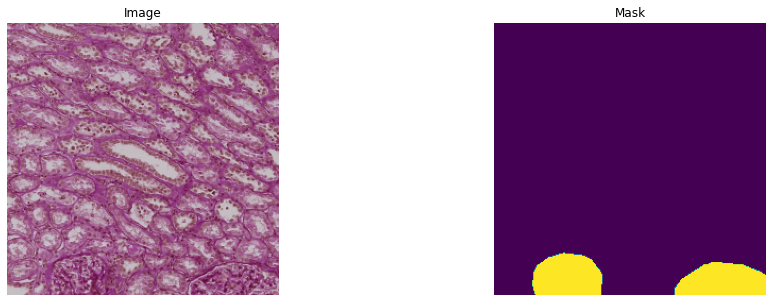

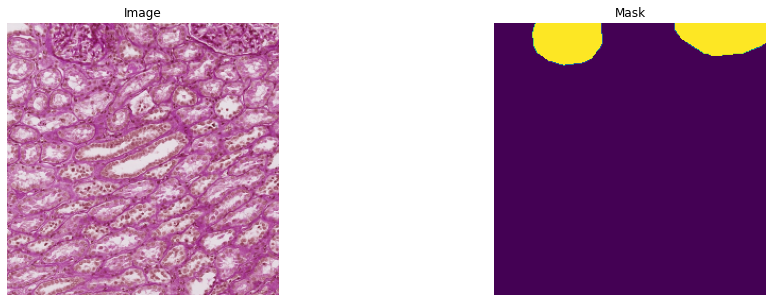

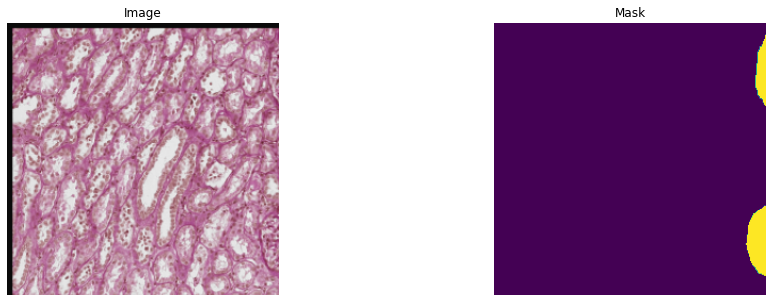

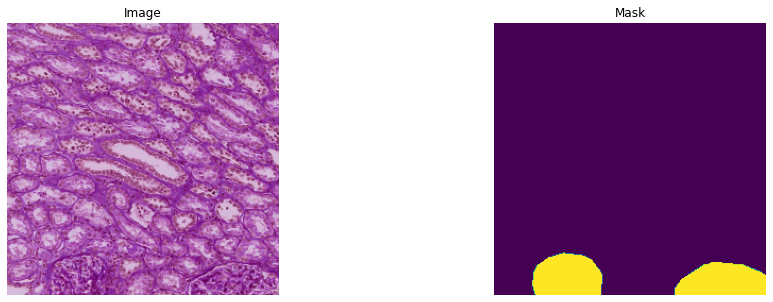

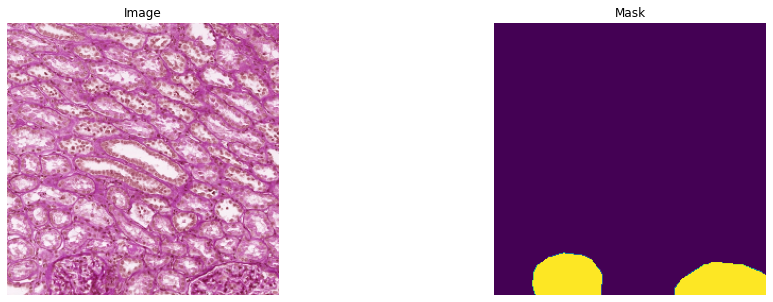

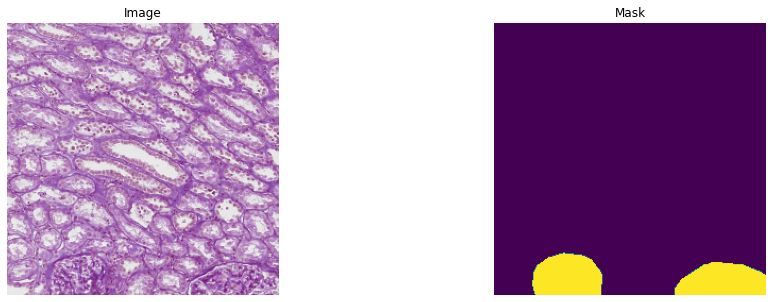

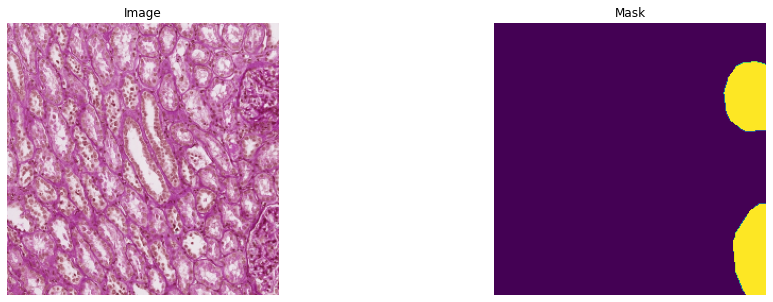

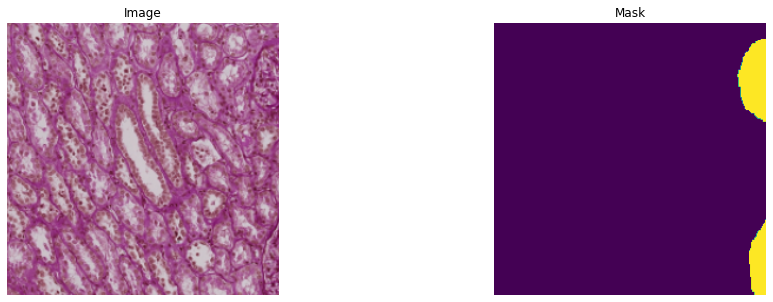

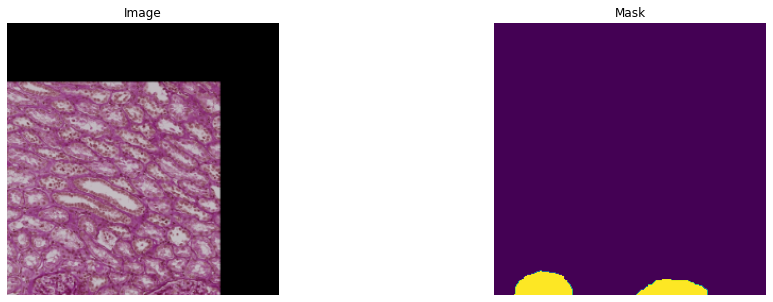

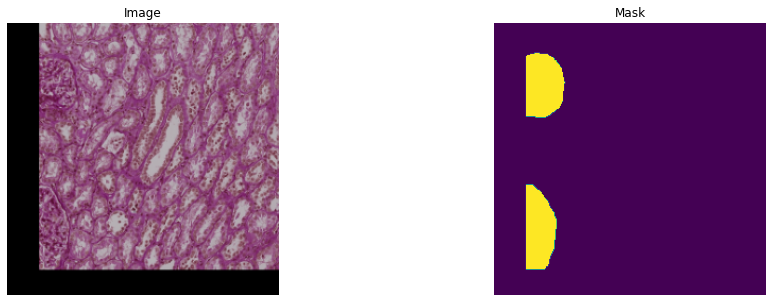

In [30]:
# check augmentation 
for i in range(10):
    image, mask = aug_dataset[3]
    visualize(image=image, mask=mask.squeeze(-1))

## Step 4. 모델 학습
segmentation 모델을 모아놓은 library를 활용합니다.  
segmentation models by. qubvel  
https://github.com/qubvel/segmentation_models.pytorch

### Unet
실습에서 사용할 모델은 Unet입니다.  
Unet은 말 그대로 U자 모양으로 생긴 모델로   
입력 영상의 context 포착을 위한 contracting path와    
추출한 feature map을 upsampling하는 구간인 expanding path로 구성되어 있습니다.  
최종 output은 각 pixel에 target 유무에 대한 probability로 나오게 됩니다.

![Unet](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FvLAIi%2FbtqBCmVoUFu%2FsaODCYPMvM5Siesq8s3gP1%2Fimg.png)

### Dice loss
$
DL = 1 - {{2p_{i1}y_{i1} +\gamma}\over{p_{i1}^{2}y_{i1}^{2} +\gamma}}
$
실습에서 사용하는 loss function은 dice loss로 dice coefficient를 loss로 활용합니다.  
dice coefficient는 prediction과 ground truth의 overlap area에 2를 곱하고  
prediction과 ground truth 영역을 합한 값으로 나누어 구합니다.

![Dice loss](https://i.stack.imgur.com/OsH4y.png)

In [31]:
train_dataset = HuBMAPDataset(train_paths, 
                              'train',
                              augmentation=get_training_augmentation(), 
                              preprocessing=get_preprocessing()
                            )
valid_dataset = HuBMAPDataset(val_paths,
                              'val',
                              augmentation=get_validation_augmentation(), 
                              preprocessing=get_preprocessing()
                            )
train_loader = torch.utils.data.DataLoader(train_dataset, 
                                            batch_size=16, 
                                            shuffle=True, 
                                            num_workers=4, 
                                            pin_memory=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                                            batch_size=8, 
                                            shuffle=False, 
                                            num_workers=4, 
                                            pin_memory=True)

In [32]:
import segmentation_models_pytorch as smp

In [33]:
ENCODER = 'se_resnext50_32x4d'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=None, 
    in_channels=3,
    classes=1, 
    activation=ACTIVATION,
)

In [34]:
loss = smp.utils.losses.DiceLoss()

metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [35]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [36]:
save_path = "./ckpt/Unet_Resnext50"

try: 
    if not os.path.exists(save_path): 
        os.makedirs(save_path)
        print(f"New directory!: {save_path}")
except OSError: 
    print("Error: Failed to create the directory.")

New directory!: ./ckpt/Unet_Resnext50


In [37]:
# train model for 10 epochs
epoch = 10
max_score = 0

for i in range(0, epoch-1):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, os.path.join(save_path, 'best_model01.pth'))
        print('New Record!')
    
    torch.save(model, os.path.join(save_path, 'final_model01.pth'))
        
    if i == 100:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|██████████| 23/23 [00:01<00:00, 19.58it/s, dice_loss - 0.8067, iou_score - 0.2657]
New Record!

Epoch: 1
valid: 100%|██████████| 23/23 [00:01<00:00, 20.12it/s, dice_loss - 0.6809, iou_score - 0.4436]
New Record!

Epoch: 2
valid: 100%|██████████| 23/23 [00:01<00:00, 20.26it/s, dice_loss - 0.5708, iou_score - 0.4915]
New Record!

Epoch: 3
valid: 100%|██████████| 23/23 [00:01<00:00, 19.57it/s, dice_loss - 0.4792, iou_score - 0.5328]
New Record!

Epoch: 4
valid: 100%|██████████| 23/23 [00:01<00:00, 20.19it/s, dice_loss - 0.4991, iou_score - 0.4249]

Epoch: 5
valid: 100%|██████████| 23/23 [00:01<00:00, 19.41it/s, dice_loss - 0.3364, iou_score - 0.6744]
New Record!

Epoch: 6
valid: 100%|██████████| 23/23 [00:01<00:00, 19.03it/s, dice_loss - 0.3229, iou_score - 0.6108]

Epoch: 7
valid: 100%|██████████| 23/23 [00:01<00:00, 19.83it/s, dice_loss - 0.2744, iou_score - 0.6503]

Epoch: 8
valid: 100%|██████████| 23/23 [00:01<00:00, 20.06it/s, dice_loss - 0.296, iou_score - 0.59

## Step 5. 평가

### Step 5-1. Patch-wise validation
평가는 patch-wise와 whole slide-wise 두가지로 진행합니다.  
먼저 patch-wise로 predict mask의 dice coefficient 평균을 구하고  
실제로 어떤 형태로 prediction되는지 시각화해봅니다.

In [38]:
test_img_path_ls = glob.glob('./wsi/test/wsi/*')
test_img_path_ls = [file for file in test_img_path_ls if file.endswith(".png")]
test_img_path_ls.sort()
test_mask_path_ls = glob.glob('./wsi/test/mask/*')
test_mask_path_ls = [file for file in test_mask_path_ls if file.endswith(".png")]
test_mask_path_ls.sort()
test_paths = list(zip(test_img_path_ls, test_mask_path_ls))

In [39]:
best_model = torch.load(os.path.join("./ckpt/Unet_Resnext50", 'best_model01.pth'))

In [40]:
# code reference: https://gist.github.com/gergf/acd8e3fd23347cb9e6dc572f00c63d79
def dice(true_mask, pred_mask, non_seg_score=1.0):
    """
        Computes the Dice coefficient.
        Args:
            true_mask : Array of arbitrary shape.
            pred_mask : Array with the same shape than true_mask.  
        
        Returns:
            A scalar representing the Dice coefficient between the two segmentations. 
        
    """
    assert true_mask.shape == pred_mask.shape

    true_mask = np.asarray(true_mask).astype(np.bool_)
    pred_mask = np.asarray(pred_mask).astype(np.bool_)

    # If both segmentations are all zero, the dice will be 1. (Developer decision)
    im_sum = true_mask.sum() + pred_mask.sum()
    if im_sum == 0:
        return non_seg_score

    # Compute Dice coefficient
    intersection = np.logical_and(true_mask, pred_mask)
    return 2. * intersection.sum() / im_sum

In [41]:
test_dataset = HuBMAPDataset(test_img_path_ls, 
                             'test',
                             preprocessing=get_preprocessing()
                        )

test_dataloader = torch.utils.data.DataLoader(test_dataset, 
                                              batch_size=1, 
                                              shuffle=False, 
                                              num_workers=4)

test_dataset_vis = HuBMAPDataset(test_paths, 'val')

tot_patch_dice_coef = 0
best_model.eval()

for i in range(len(test_dataset)):
    
    image_vis, gt = test_dataset_vis[i] #.astype('uint8')
    image = test_dataset[i]
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    with torch.set_grad_enabled(False):
        pr_mask = best_model.predict(x_tensor)
        pr_mask = (pr_mask.squeeze().cpu().numpy().round().astype('uint8'))
    tot_patch_dice_coef += dice(gt.squeeze(), pr_mask)
print(f"Average of patch-wise dice coefficient: {tot_patch_dice_coef/len(test_dataset)}")

Average of patch-wise dice coefficient: 0.6812588399570081


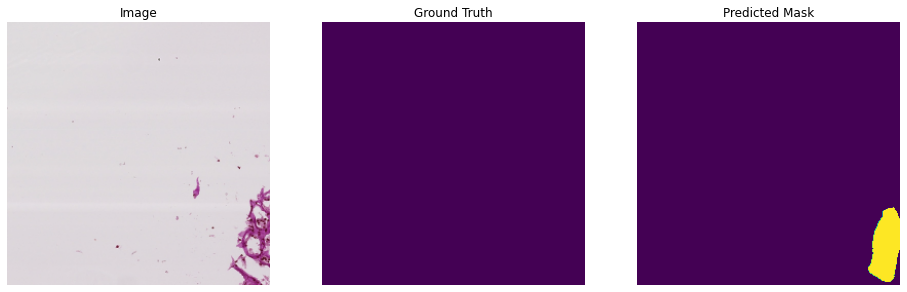

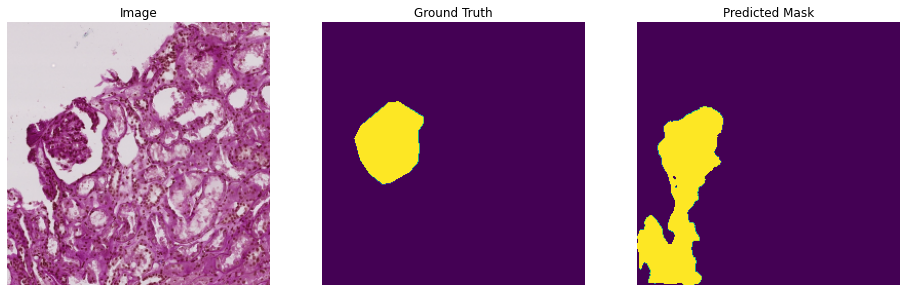

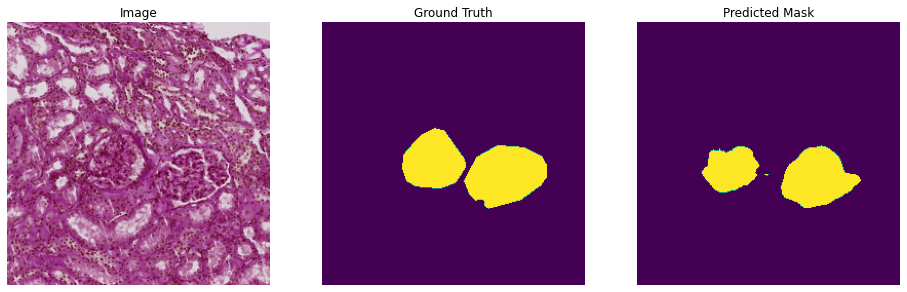

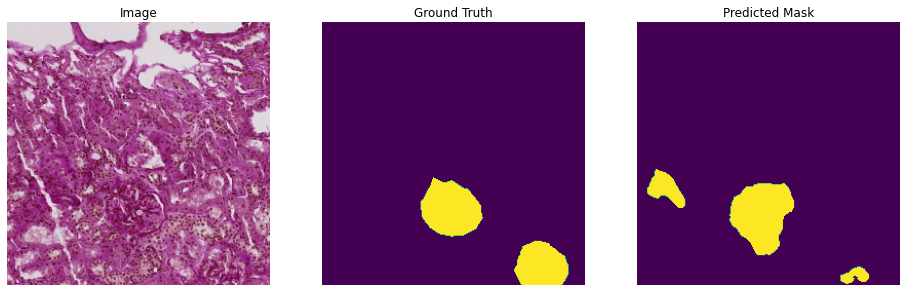

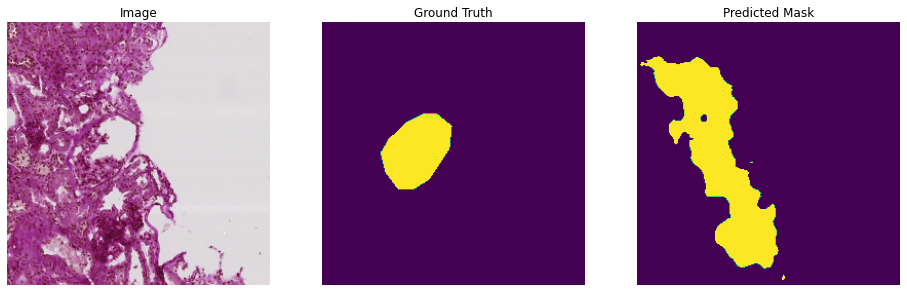

...

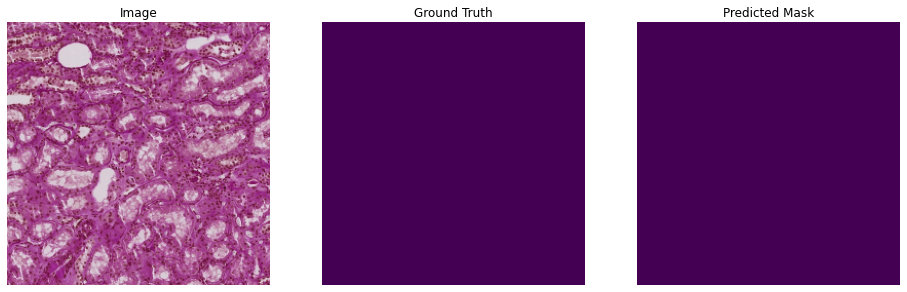

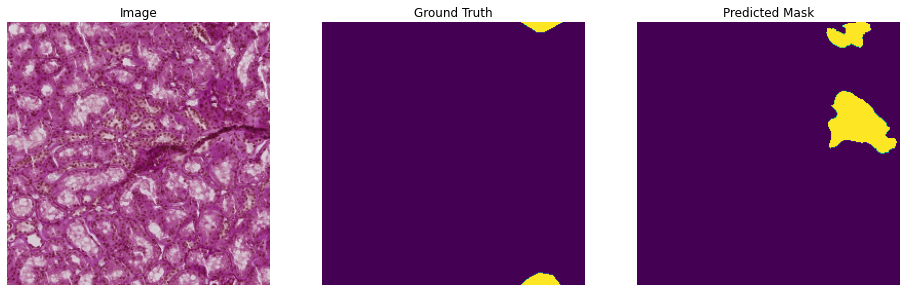

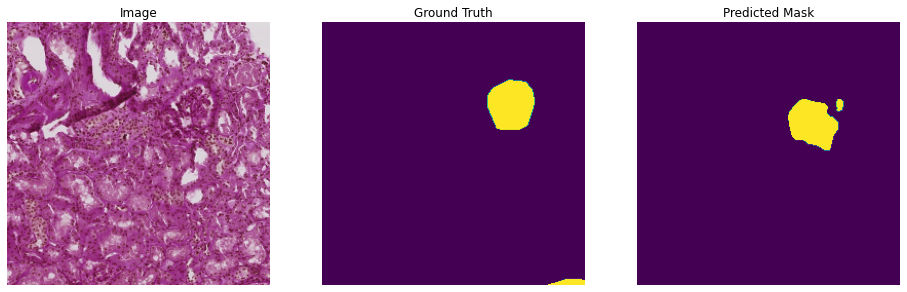

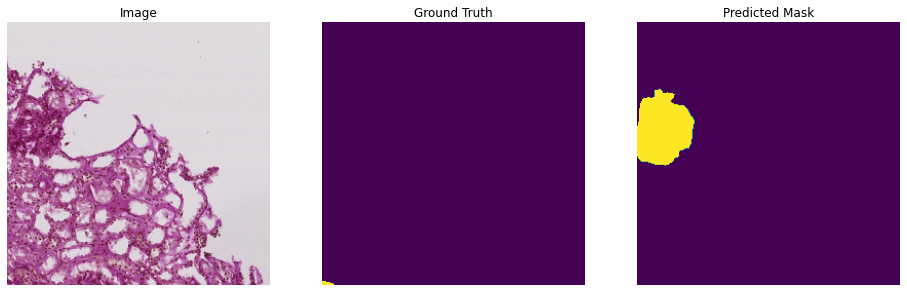

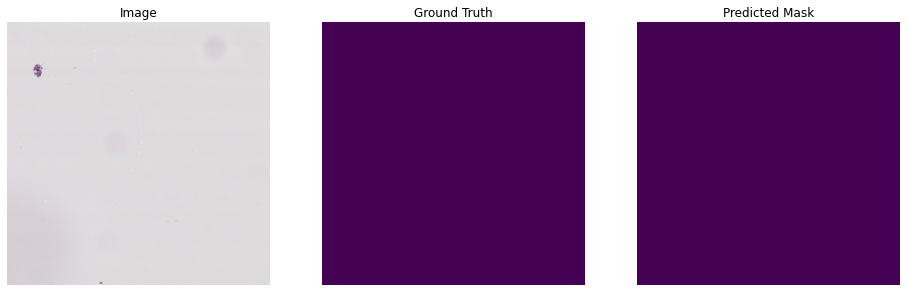

In [42]:
for i in range(30,50):
    
    image_vis, gt = test_dataset_vis[i] #.astype('uint8')
    image = test_dataset[i]
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    with torch.set_grad_enabled(False):
        pr_mask = best_model.predict(x_tensor)
        pr_mask = (pr_mask.squeeze().cpu().numpy().round().astype('uint8'))
        
    visualize(
        image=image_vis, 
        ground_truth = gt,
        predicted_mask=pr_mask
    )

실습의 편의를 위해 미리 학습한 weight를 갖고 평가를 진행합니다.

In [43]:
best_model = torch.load(os.path.join("./wsi/best_ckpt", 'best_model.pth'))

In [44]:
test_dataset = HuBMAPDataset(test_img_path_ls, 
                             'test',
                             preprocessing=get_preprocessing()
                        )

test_dataloader = torch.utils.data.DataLoader(test_dataset, 
                                              batch_size=1, 
                                              shuffle=False, 
                                              num_workers=4)

test_dataset_vis = HuBMAPDataset(test_paths, 'val')

tot_patch_dice_coef = 0
best_model.eval()

for i in range(len(test_dataset)):
    
    image_vis, gt = test_dataset_vis[i] #.astype('uint8')
    image = test_dataset[i]
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    with torch.set_grad_enabled(False):
        pr_mask = best_model.predict(x_tensor)
        pr_mask = (pr_mask.squeeze().cpu().numpy().round().astype('uint8'))
    tot_patch_dice_coef += dice(gt.squeeze(), pr_mask)
print(f"Average of patch-wise dice coefficient: {tot_patch_dice_coef/len(test_dataset)}")

Average of patch-wise dice coefficient: 0.9115265147747221


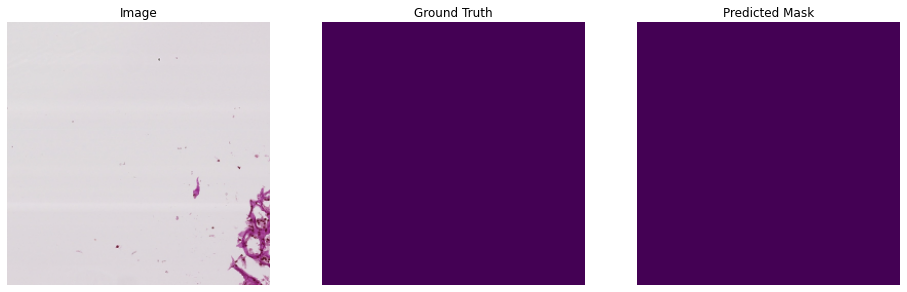

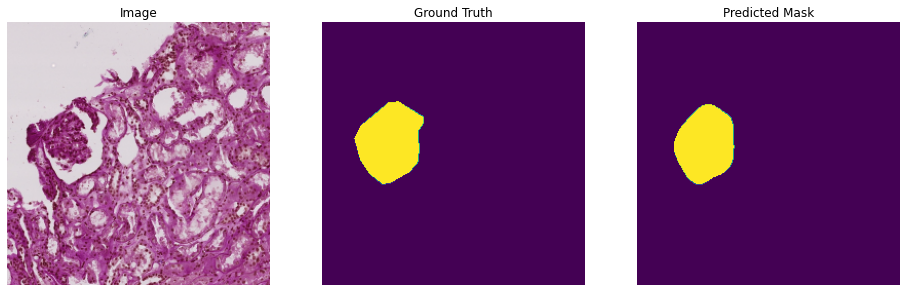

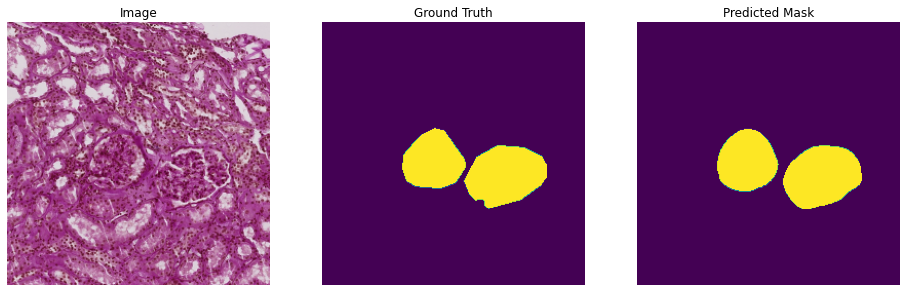

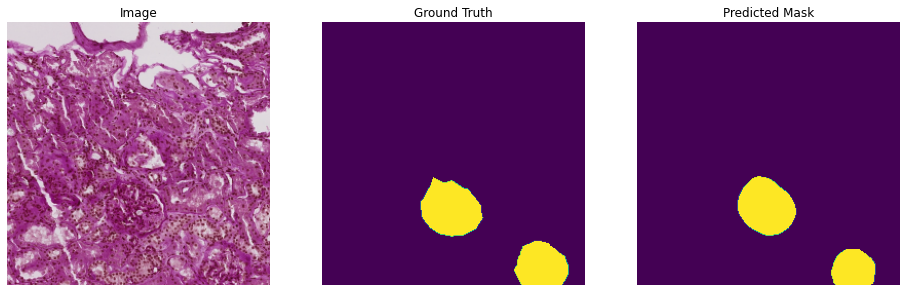

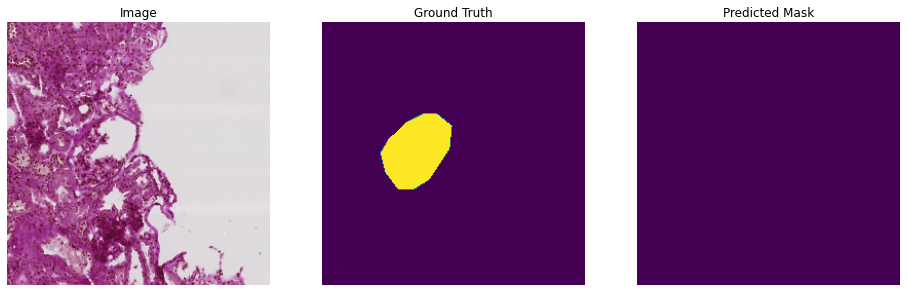

...

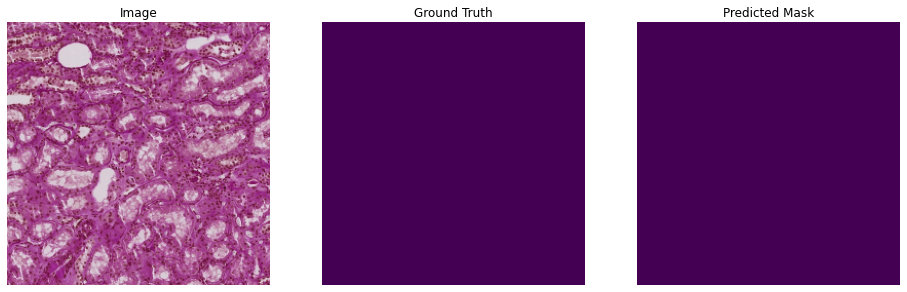

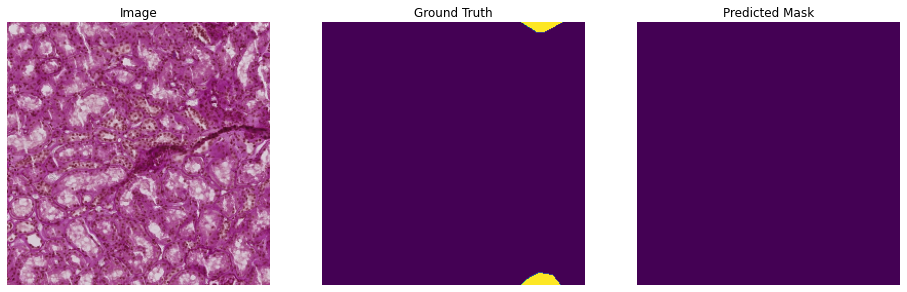

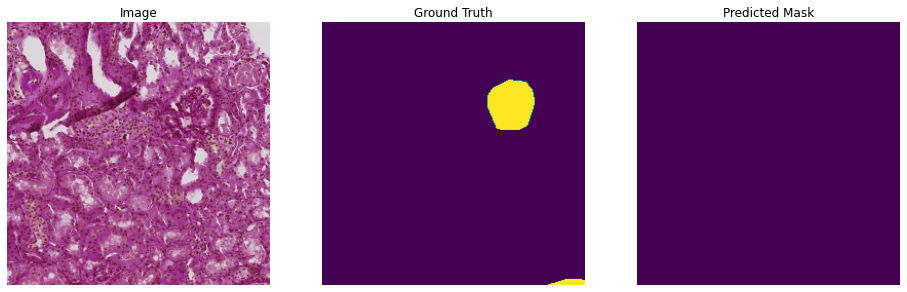

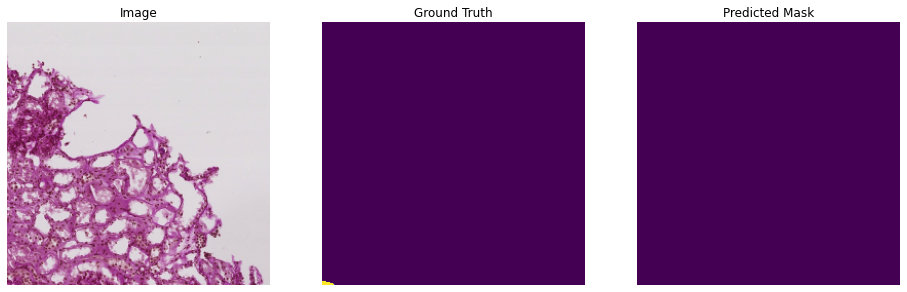

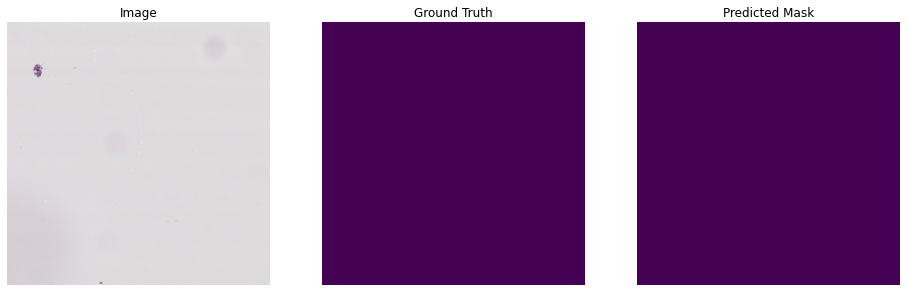

In [45]:
for i in range(30,50):
    
    image_vis, gt = test_dataset_vis[i] #.astype('uint8')
    image = test_dataset[i]
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    with torch.set_grad_enabled(False):
        pr_mask = best_model.predict(x_tensor)
        pr_mask = (pr_mask.squeeze().cpu().numpy().round().astype('uint8'))
        
    visualize(
        image=image_vis, 
        ground_truth = gt,
        predicted_mask=pr_mask
    )

### Step 5-2. Whole image-wise validation
patch로 나누어 결과를 출력하고, 다시 Whole Slide Image로 합치는 과정이 필요합니다.  
합친 후, whole image에서의 평가를 진행합니다.

In [46]:
def extract_slide_tiles(file_paths, ID):
    def check_id(file_path):
        return os.path.splitext(os.path.basename(file_path))[0].split('_')[0]
    tile_ls = [path for path in file_paths if check_id(path)==ID]
    return sorted(tile_ls)

IDX = 'aaa6a05cc'
slide_paths = extract_slide_tiles(test_img_path_ls, IDX)

# padded and reduced shape of corresponding image
height, width = (4864, 3328)

In [47]:
from tqdm import tqdm

In [48]:
# one slide predictions
test_dataset = HuBMAPDataset(slide_paths, 
                             'test',
                             preprocessing=get_preprocessing()
                        )

test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

test_dataset_vis = HuBMAPDataset(slide_paths, 'test')

best_model.eval()

mask_preds = []
for i, image in enumerate(tqdm(test_dataloader)):
    image_vis = test_dataset_vis[i].astype('uint8')
    
    image = image.to(DEVICE)
    with torch.set_grad_enabled(False):
        mask_pred = best_model(image)
        mask_pred = mask_pred.squeeze().cpu().numpy().round().astype('uint8')
    mask_preds.append(np.expand_dims(mask_pred, axis=0))
    

mask_preds = np.concatenate(mask_preds)

100%|██████████| 247/247 [00:04<00:00, 51.88it/s]


In [49]:
# patch-wise image를 합치는 과정
merge_image = np.zeros((height, width, 3))

k = 0
for i in range(0, height // TILE_SIZE):
    for j in range(0, width // TILE_SIZE):
        image = np.array(Image.open(slide_paths[k]))
        merge_image[i*TILE_SIZE:i*TILE_SIZE + TILE_SIZE, j*TILE_SIZE:j*TILE_SIZE + TILE_SIZE, :] = image
        k += 1

In [50]:
# prediction mask를 합치는 과정
merge_mask = np.zeros((height, width))

k = 0
for i in range(0, height // TILE_SIZE):
    for j in range(0, width // TILE_SIZE):
        merge_mask[i*TILE_SIZE:i*TILE_SIZE + TILE_SIZE, j*TILE_SIZE:j*TILE_SIZE + TILE_SIZE] = mask_preds[k]
        k += 1

In [51]:
# Ground Truth mask 불러오기
sample_img_path = os.path.join(HuBMAP_PATH, "aaa6a05cc.tiff") 
rle_mask_sample = hubmap_rle_info[hubmap_rle_info["id"]==IDX].encoding.values[0]
sample_image = tiff.imread(sample_img_path)
gt_mask = rle_decode(rle_mask_sample, sample_image.shape[0:2])
pad0 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[0]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
pad1 = (REDUCE_RATE*TILE_SIZE - sample_image.shape[1]%(REDUCE_RATE*TILE_SIZE))%(REDUCE_RATE*TILE_SIZE)
gt_mask = np.pad(gt_mask,[[pad0//2,pad0-pad0//2],[pad1//2,pad1-pad1//2]],
              constant_values=0)
gt_mask = cv2.resize(gt_mask,(gt_mask.shape[1]//REDUCE_RATE,gt_mask.shape[0]//REDUCE_RATE),
                         interpolation = cv2.INTER_AREA)

In [52]:
print(f"Whole image-wise dice coefficient: {dice(gt_mask, merge_mask)}")

Whole image-wise dice coefficient: 0.8550106355010636


Text(0.5, 1.0, 'prediction')

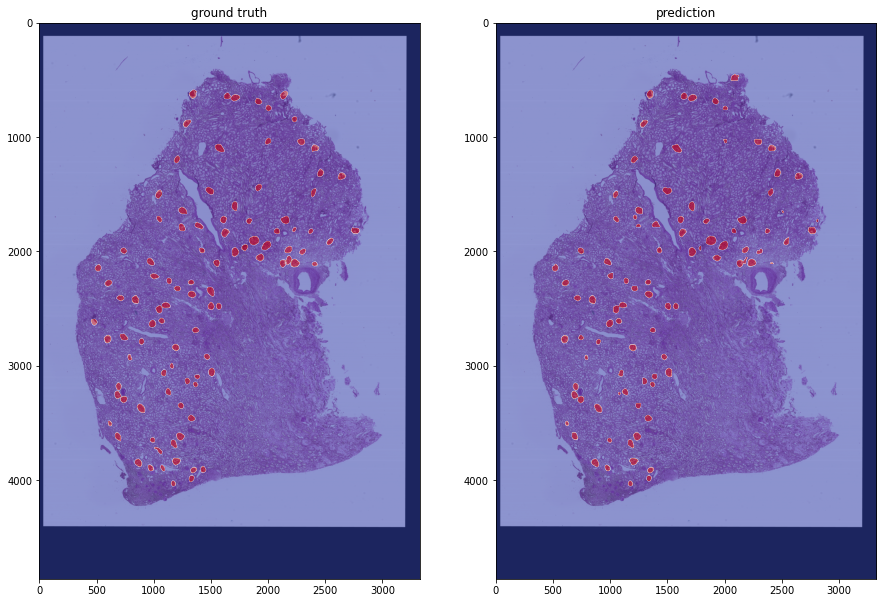

In [53]:
fig,ax = plt.subplots(1,2,figsize=(15,15))
ax[0].imshow(merge_image.astype('uint8'))
ax[0].imshow(gt_mask, cmap='coolwarm', alpha=0.5)
ax[0].set_title("ground truth")
ax[1].imshow(merge_image.astype('uint8'))
ax[1].imshow(merge_mask.astype('uint8'), cmap='coolwarm', alpha=0.5)
ax[1].set_title("prediction")

### Step 5-3. IoU score
IoU score는 segmentation model을 평가하는 지표 중 하나로,  
예측 결과와 Ground Truth 간 교집합 영역 넓이/ 합집합 영역 넓이로 점수를 매깁니다.  
일치할 경우 1, 어느 하나 매치하지 않다면 score는 0이 됩니다.

![iou](https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png)

https://www.pyimagesearch.com/

In [54]:
from sklearn.metrics import confusion_matrix

In [55]:
def compute_iou(y_pred, y_true):
     # ytrue, ypred is a flatten vector
    y_pred = y_pred.flatten()
    y_true = y_true.flatten()
    current = confusion_matrix(y_true, y_pred, labels=[0, 1])
    # compute mean iou
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection
    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

In [56]:
compute_iou(merge_mask, gt_mask)

0.8710917385195527